In [1]:
import matplotlib
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import os
import umap
import datashader as ds
import colorcet as cc
import igraph
import tqdm
from scipy import sparse
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import KMeans

from matplotlib.collections import PolyCollection
from matplotlib.colors import ListedColormap

from dredFISH.Analysis import TissueGraph
from dredFISH.Visualization import Viz
from dredFISH.Utils.__init__plots import * 
from dredFISH.Utils import powerplots
from dredFISH.Utils import miscu
from dredFISH.Utils import tmgu

import importlib
importlib.reload(Viz)
importlib.reload(TissueGraph)

<module 'dredFISH.Analysis.TissueGraph' from '/bigstore/GeneralStorage/fangming/projects/dredfish/packages/dredFISH/dredFISH/Analysis/TissueGraph.py'>

#### Load data

In [2]:
respath = '/bigstore/GeneralStorage/fangming/projects/dredfish/figures/'

In [3]:
basepth = '/bigstore/GeneralStorage/Data/dredFISH/Dataset1'
!ls -alhtr $basepth
!head $basepth"/TMG.json"

total 108M
-rw-r--r-- 1 zach     wollmanlab  16M Jun  9 14:55 DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_matrix.csv
-rw-r--r-- 1 zach     wollmanlab  20M Jun  9 14:55 DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_metadata.csv
-rw-rw-r-- 1 rwollman wollmanlab  165 Jul  7 16:00 TMG.json
-rw-r--r-- 1 fangming wollmanlab  40M Jul  7 16:00 cell.h5ad
-rw-r--r-- 1 fangming wollmanlab 6.8M Jul  7 16:00 isozone.h5ad
-rw-rw-r-- 1 rwollman wollmanlab 647K Jul  7 16:00 region.h5ad
-rw-r--r-- 1 fangming wollmanlab    3 Jul  7 16:00 Taxonomy_clusters.csv
-rw-r--r-- 1 fangming wollmanlab    3 Jul  7 16:00 Taxonomy_topics.csv
drwxrwxrwx 7 zach     wollmanlab 4.0K Jul  8 12:44 ..
drwxrwxr-x 2 rwollman wollmanlab 4.0K Jul 14 14:17 .
-rw-r--r-- 1 fangming wollmanlab  27M Jul 14 14:19 analysis_dev.csv
{"layers_graph": [[0, 1], [0, 2]], "layer_taxonomy_mapping": {"0": 0, "1": 0, "2": 1}, "Taxonomies": ["clusters", "topics"], "Layers": ["cell", "isozone", "region"]}

In [4]:
df = pd.read_csv(
    os.path.join(basepth, "analysis_dev.csv"))
df

,Unnamed: 0,x,y,umap_x,umap_y,b0,b1,b2,b3,b4,...,type_r0.01,type_r0.02,type_r0.05,type_r0.1,type_r0.2,type_r0.5,type_r1,type_r2,type_r5,type_r10
0,0,1911.666962,-1749.638192,-1.901928,-2.967294,-0.603849,1.714861,0.594060,0.139496,1.509942,...,t1,t1,t1,t3,t2,t5,t8,t14,t42,t35
1,1,1850.678429,-1747.172043,-1.789862,-2.849200,-0.530279,1.681959,1.301185,-0.464006,1.570054,...,t1,t1,t1,t3,t2,t5,t8,t14,t42,t35
2,2,1515.123295,-1746.940031,0.184749,0.178933,-0.603849,-0.362498,0.620053,-1.128423,1.206578,...,t1,t1,t1,t3,t2,t5,t10,t4,t34,t61
3,3,1426.161788,-1748.456394,-0.917661,0.854812,-0.298989,1.023065,1.517082,-0.341796,0.475449,...,t1,t1,t1,t3,t2,t4,t10,t4,t53,t63
4,4,1739.792930,-1749.407386,2.384448,-0.265512,-0.603849,-1.351786,1.025515,-1.128423,0.327118,...,t1,t1,t1,t1,t1,t1,t6,t3,t19,t13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77841,77841,-2188.756848,-1084.480934,-4.423579,4.242474,-0.603849,-0.271399,-0.666686,0.269214,0.821624,...,t1,t1,t1,t3,t2,t8,t12,t24,t60,t60
77842,77842,-2257.822983,-1083.270665,-5.205501,5.288445,0.936062,0.386319,-0.614982,1.752306,0.067531,...,t1,t1,t3,t4,t6,t8,t12,t7,t3,t1
77843,77843,-2475.320577,-1083.995803,-5.016026,4.596395,-0.603849,-0.228163,-0.612215,0.895132,0.247026,...,t1,t1,t2,t2,t5,t7,t7,t25,t48,t48
77844,77844,-2311.578984,-1086.717336,1.987716,0.121741,-0.603849,-1.153599,0.699586,-0.204732,1.546018,...,t1,t1,t1,t1,t1,t1,t6,t6,t50,t108


In [5]:
TMG = TissueGraph.TissueMultiGraph(basepath=basepth, 
                                   redo=False, # load existing 
                                  )
TMG

/bigstore/GeneralStorage/Data/dredFISH/Dataset1/cell.h5ad
/bigstore/GeneralStorage/Data/dredFISH/Dataset1/isozone.h5ad
/bigstore/GeneralStorage/Data/dredFISH/Dataset1/region.h5ad


In [6]:
# spatial coordinates
layer = TMG.Layers[0]
XY = layer.XY
x, y = XY[:,0], XY[:,1]
###
x, y = y, x # a temporary hack
###

cells = layer.adata.obs.index.values

N = layer.N
print(N)
# measured basis
ftrs_mat = layer.feature_mat

# umap_mat = umap.UMAP(n_neighbors=30, min_dist=0.1).fit_transform(ftrs_mat)

# types

# regions

77846


In [7]:
labels = df['type_r0.1'].values
edges = np.asarray(layer.SG.get_edgelist()) 
ctg, ctg_idx = np.unique(labels, return_inverse=True) 
print(ctg)

i = edges[:,0] # cells
j = ctg_idx[edges[:,1]] # types it connects
dat = np.repeat(1, len(i))

env_mat = sparse.coo_matrix((dat, (i,j)), shape=(N, len(ctg))).toarray() # dense
env_mat = env_mat/env_mat.sum(axis=1).reshape(-1,1)
env_mat = np.nan_to_num(env_mat, 0)
env_mat

['t1' 't2' 't3' 't4' 't5' 't6']


/tmp/ipykernel_2048178/2235391810.py:11: RuntimeWarning: invalid value encountered in true_divide
  env_mat = env_mat/env_mat.sum(axis=1).reshape(-1,1)


array([[0.8       , 0.        , 0.2       , 0.        , 0.        ,
        0.        ],
       [0.71428571, 0.        , 0.28571429, 0.        , 0.        ,
        0.        ],
       [0.66666667, 0.        , 0.33333333, 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ]])

In [8]:
%%time
k_kms = [5, 10] #[2,5,10,20,50,100]
for k_km in tqdm.tqdm(k_kms):
    kmeans = KMeans(n_clusters=k_km, random_state=1)
    reg_clsts = kmeans.fit_predict(env_mat)
    df[f'type_reg_k{k_km}'] = np.char.add('t', np.array(reg_clsts).astype(str))

100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

CPU times: user 1min 21s, sys: 6.3 s, total: 1min 27s
Wall time: 1.82 s


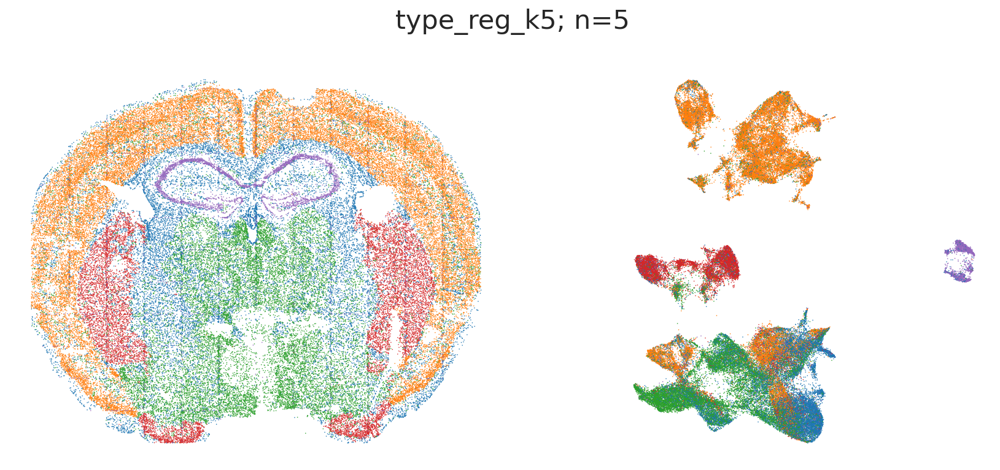

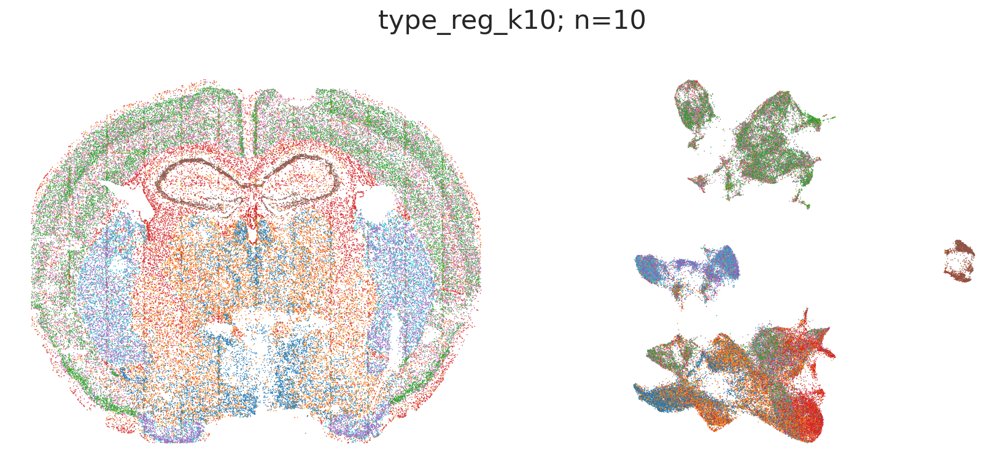

In [9]:
for k_km in k_kms:
    hue = f'type_reg_k{k_km}'
    hue_order = np.sort(np.unique(df[hue]))
    ntypes = len(hue_order)

    fig, axs = plt.subplots(1, 2, figsize=(8*2,6))
    fig.suptitle(f"{hue}; n={ntypes}")
    ax = axs[0]
    sns.scatterplot(data=df, x='x', y='y', 
                    hue=hue, hue_order=hue_order, 
                    s=0.5, edgecolor=None, 
                    legend=False,
                    ax=ax)
    # ax.legend(loc='upper left', bbox_to_anchor=(0, -0.1), ncol=5)
    ax.set_aspect('equal')
    ax.axis('off')

    ax = axs[1]
    sns.scatterplot(data=df, x='umap_x', y='umap_y', 
                    hue=hue, hue_order=hue_order, 
                    s=0.5, edgecolor=None, 
                    legend=False,
                    ax=ax)
    # ax.legend(loc='upper left', bbox_to_anchor=(0, -0.1), ncol=5)
    ax.set_aspect('equal')
    ax.axis('off')
    fig.subplots_adjust(wspace=0)
    plt.show()

# Get from region types to regions; and visualize region boundaries 

In [10]:
k_km = 10 
region_types = df[f'type_reg_k{k_km}'].values
region_types

array(['t3', 't1', 't1', ..., 't8', 't8', 't8'], dtype=object)

In [11]:
polys = TMG.Geoms[0]['poly'] #) #) #[0]
bdbox = np.array(TMG.Geoms[0]['BoundingBox'].exterior.xy).T

# a hack
polys = [np.vstack([poly[:,1], poly[:,0]]).T for poly in polys]
bdbox = np.array(np.vstack([bdbox[:,1], bdbox[:,0]])).T
# end of the hack

mx = np.max(bdbox,axis=0)
mn = np.min(bdbox,axis=0)

ctg, idx = np.unique(region_types, return_inverse=True)
colors = sns.color_palette("Set2", len(ctg))
colors

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254),
 (0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961)]

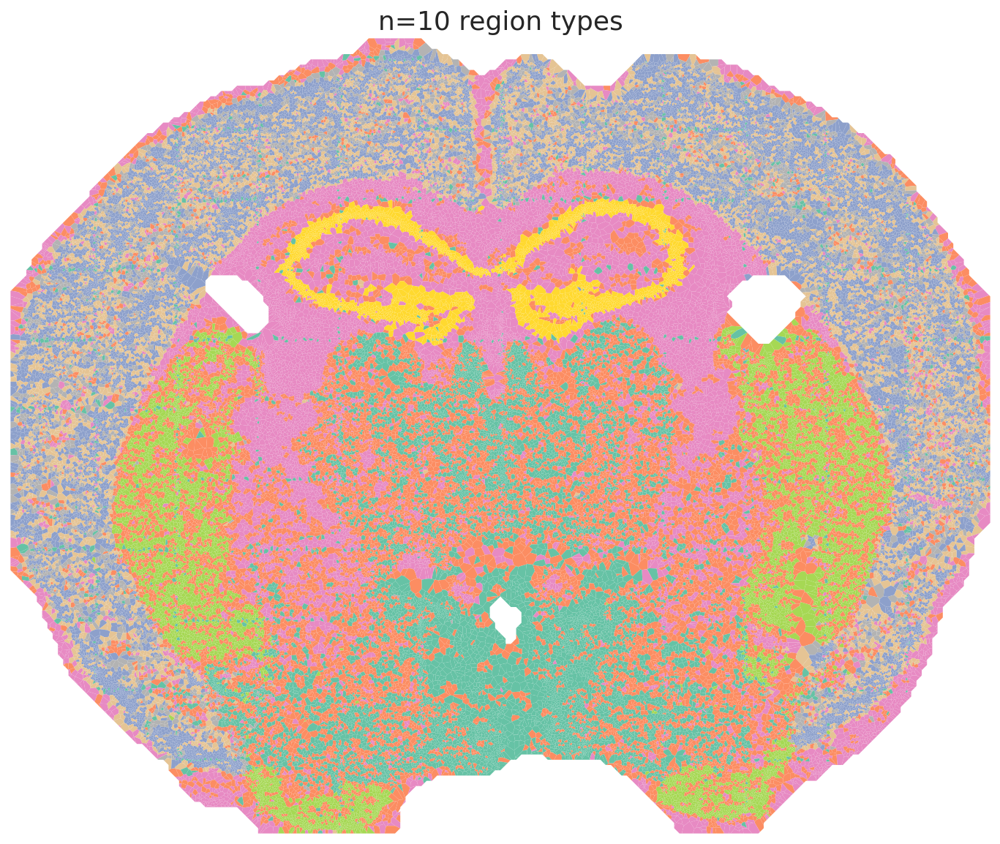

In [12]:
fig, ax = plt.subplots(figsize=(12,10))
p = PolyCollection(polys, edgecolors=('none'), cmap=ListedColormap(colors)) # cmap=self.clrmp)
p.set_array(idx)

ax.add_collection(p)
ax.set_aspect('equal') #, 'box')
ax.set_xlim([mn[0],mx[0]])
ax.set_ylim([mn[1],mx[1]])
ax.axis('off')
ax.set_title(f"n={len(colors)} region types")

plt.show()

# get regions (region type zones) 

In [13]:
def get_cell_zones(SG, cell_types):
    """
    """
    N = len(cell_types)
    
    # trim edges -- remove connects from diffent types
    edges = np.asarray(SG.get_edgelist())
    edges_bytype = cell_types[edges]
    edges_sametype = edges[edges_bytype[:,0]==edges_bytype[:,1]]

    # get components (same type and spatially connected); each component is assigned an index
    zones = igraph.Graph(n=N, edges=edges_sametype, directed=False)
    zone_types = np.asarray(zones.components().membership)

    return zone_types

In [14]:
# region_types.
np.unique(region_types)

array(['t0', 't1', 't2', 't3', 't4', 't5', 't6', 't7', 't8', 't9'],
      dtype=object)

In [15]:
SG = layer.SG
# cell -> type (clustering)
cell_types = region_types
# cell -> zone (continuity)
cell_zones = get_cell_zones(layer.SG, cell_types)
# zone -> types (reindexing)
unqs, idx, invs, cnts, = np.unique(cell_zones, return_index=True, return_inverse=True, return_counts=True)
print(unqs.shape, idx.shape, invs.shape, cnts.shape)
print(np.all(unqs[invs] == cell_zones)) # use invs to recover the original
zone_types = cell_types[idx]

# sanity check
print(np.all(zone_types[cell_zones] == cell_types))
print(cell_types.shape, cell_zones.shape, zone_types.shape)

(11881,) (11881,) (77846,) (11881,)
True
True
(77846,) (77846,) (11881,)


Text(0, 0.5, 'log10(# cells in zone)')

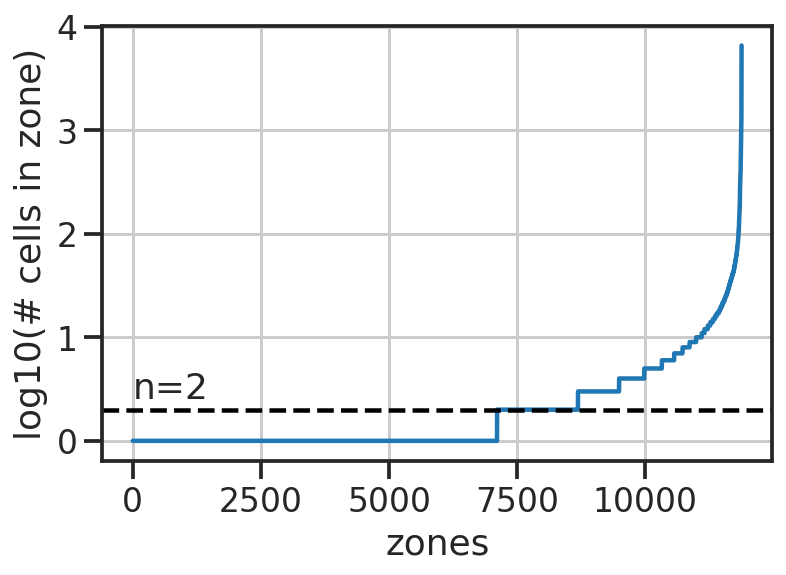

In [16]:
# unqs.shape, invs.shape, cnts.shape, 
th = 2
cond = cnts[invs] > th

fig, ax = plt.subplots()
ax.plot(np.log10(np.sort(cnts)))
ax.axhline(np.log10(th), linestyle='--', color='k')
ax.text(0, np.log10(th*1.3), f"n={th}")
ax.set_xlabel('zones')
ax.set_ylabel('log10(# cells in zone)')

In [17]:
# k_km = 10
# region_types = df[f'type_reg_k{k_km}'].values
region_types = cond

In [18]:
polys = TMG.Geoms[0]['poly'] #) #) #[0]
bdbox = np.array(TMG.Geoms[0]['BoundingBox'].exterior.xy).T

# a hack
polys = [np.vstack([poly[:,1], poly[:,0]]).T for poly in polys]
bdbox = np.array(np.vstack([bdbox[:,1], bdbox[:,0]])).T
# end of the hack

mx = np.max(bdbox,axis=0)
mn = np.min(bdbox,axis=0)

ctg, idx = np.unique(region_types, return_inverse=True)
colors = sns.color_palette("tab10", len(ctg))
colors

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725)]

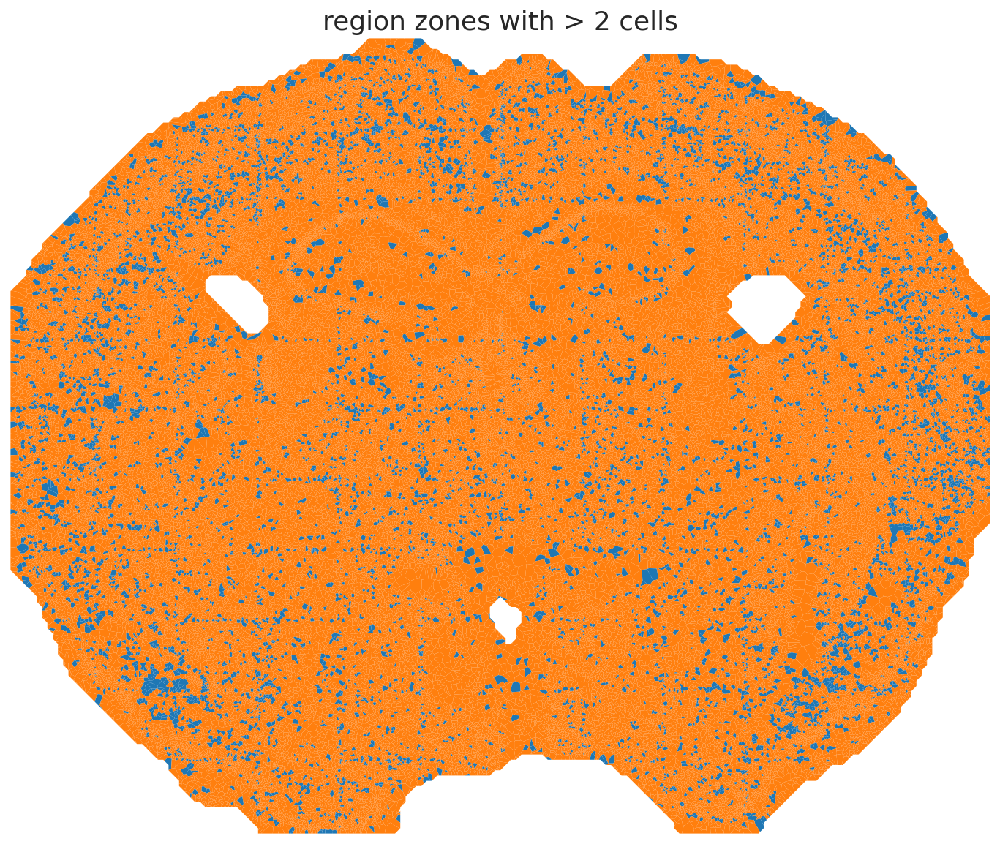

In [19]:
fig, ax = plt.subplots(figsize=(12,10))
p = PolyCollection(polys, edgecolors=('none'), cmap=ListedColormap(colors)) # cmap=self.clrmp)
p.set_array(idx)

ax.add_collection(p)
ax.set_aspect('equal') #, 'box')
ax.set_xlim([mn[0],mx[0]])
ax.set_ylim([mn[1],mx[1]])
ax.axis('off')

ax.set_title(f'region zones with > {th} cells')
plt.show()

In [20]:
# zone graph 
ZSG = SG.copy()
# comb = {'X': 'mean', 'Y': 'mean'}
ZSG.contract_vertices(cell_zones) # , combine_attrs=comb)
ZSG.simplify()

In [21]:
zsg_edges = np.asarray(ZSG.get_edgelist())

In [22]:
zsg_edges_bytype = cnts[zsg_edges] <= th
zsg_edges_difftype = zsg_edges[np.logical_xor(zsg_edges_bytype[:,0], zsg_edges_bytype[:,1])]

# sanity check
print(np.all(np.sum(cnts[zsg_edges_difftype] <= th, axis=1) == 1))

# edges with the second node bad are swapped to the first
e1, e2 = zsg_edges_difftype[:,0].copy(), zsg_edges_difftype[:,1].copy()
cond = cnts[e2]<=th # e2 is bad
e1sub, e2sub = e1[cond], e2[cond]
idxsub = np.arange(len(e1))[cond]
np.put(e1, idxsub, e2sub)
np.put(e2, idxsub, e1sub)
# sanity check
print(np.all(cnts[e1]<=th), np.sum(cnts[e2]<=th))

# uniq
e1u, e1ui = np.unique(e1, return_index=True)
e2u = e2[e1ui]

zone_remap = pd.Series(e2u, index=e1u)
print(zone_remap.shape)


True
True 0
(8660,)


In [23]:
zones_u = zone_remap.reindex(unqs).fillna(pd.Series(unqs)).astype(int)
zones_u

0           0
1           1
2           1
3           1
4           4
         ... 
11876    2174
11877    2174
11878    2174
11879     113
11880    2174
Length: 11881, dtype: int64

In [24]:
zone_types_u = zone_types[zones_u.values]
cell_types_u = zone_types_u[cell_zones]


In [25]:
# k_km = 10 
region_types = cell_types_u# df[f'type_reg_k{k_km}'].values
region_types

array(['t3', 't1', 't1', ..., 't4', 't9', 't4'], dtype=object)

In [26]:
polys = TMG.Geoms[0]['poly'] #) #) #[0]
bdbox = np.array(TMG.Geoms[0]['BoundingBox'].exterior.xy).T

# a hack
polys = [np.vstack([poly[:,1], poly[:,0]]).T for poly in polys]
bdbox = np.array(np.vstack([bdbox[:,1], bdbox[:,0]])).T
# end of the hack

mx = np.max(bdbox,axis=0)
mn = np.min(bdbox,axis=0)

ctg, idx = np.unique(region_types, return_inverse=True)
colors = sns.color_palette("Set2", len(ctg))
colors

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254),
 (0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961)]

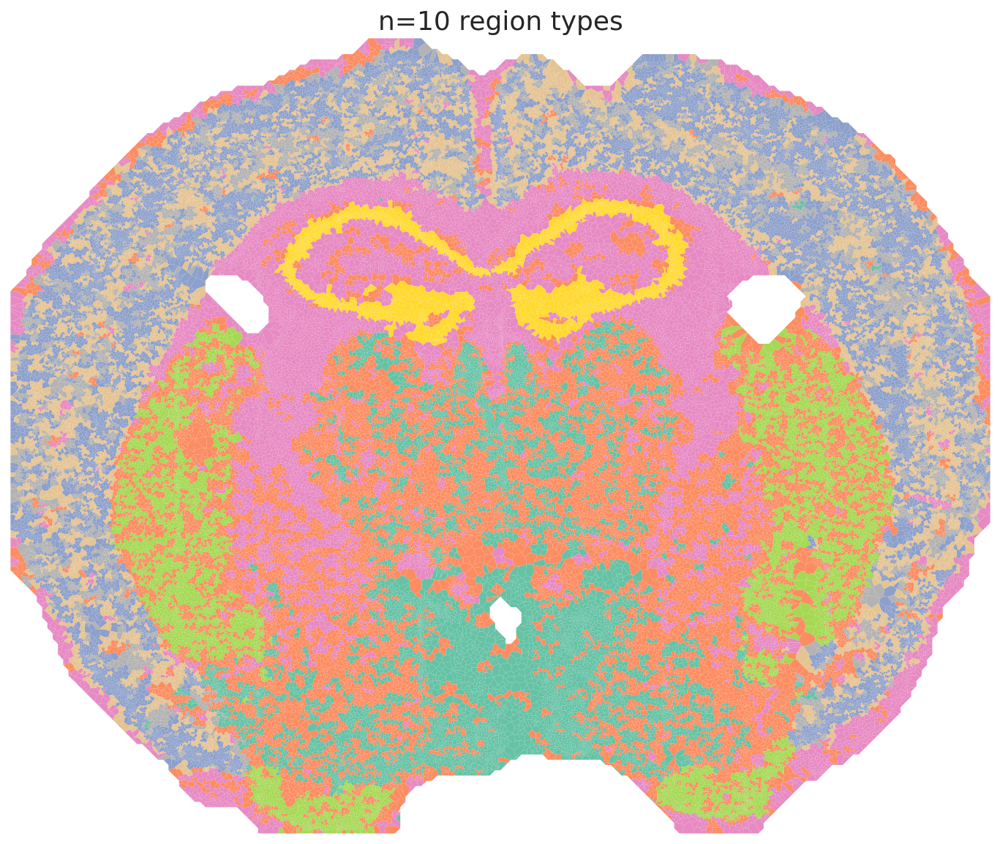

In [27]:
fig, ax = plt.subplots(figsize=(12,10))
p = PolyCollection(polys, edgecolors=('none'), cmap=ListedColormap(colors)) # cmap=self.clrmp)
p.set_array(idx)

ax.add_collection(p)
ax.set_aspect('equal') #, 'box')
ax.set_xlim([mn[0],mx[0]])
ax.set_ylim([mn[1],mx[1]])
ax.axis('off')
ax.set_title(f"n={len(colors)} region types")

plt.show()

In [28]:
SG = layer.SG
# cell -> type (clustering)
cell_types = region_types
# cell -> zone (continuity)
cell_zones = get_cell_zones(layer.SG, cell_types)
# zone -> types (reindexing)
unqs, idx, invs, cnts, = np.unique(cell_zones, return_index=True, return_inverse=True, return_counts=True)
print(unqs.shape, idx.shape, invs.shape, cnts.shape)
print(np.all(unqs[invs] == cell_zones)) # use invs to recover the original
zone_types = cell_types[idx]

# sanity check
print(np.all(zone_types[cell_zones] == cell_types))
print(cell_types.shape, cell_zones.shape, zone_types.shape)

(2636,) (2636,) (77846,) (2636,)
True
True
(77846,) (77846,) (2636,)


Text(0, 0.5, 'log10(# cells in zone)')

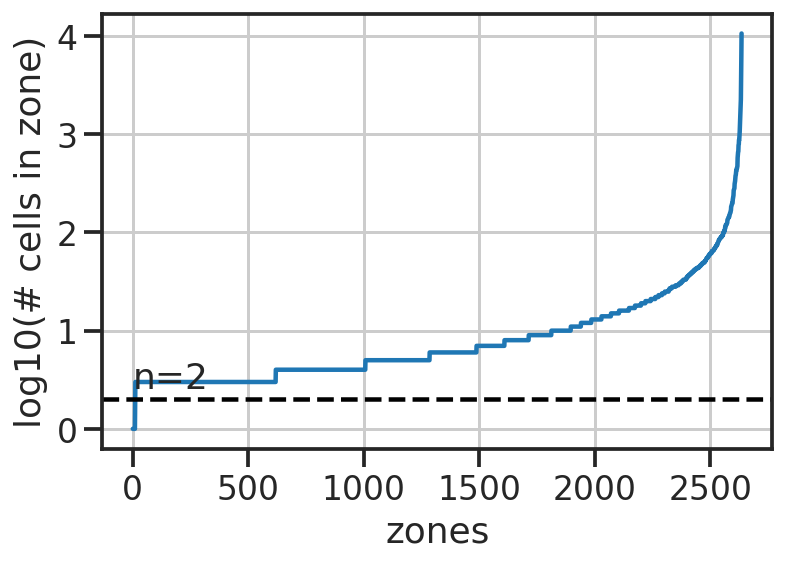

In [29]:
# unqs.shape, invs.shape, cnts.shape, 
th = 2
cond = cnts[invs] > th

fig, ax = plt.subplots()
ax.plot(np.log10(np.sort(cnts)))
ax.axhline(np.log10(th), linestyle='--', color='k')
ax.text(0, np.log10(th*1.3), f"n={th}")
ax.set_xlabel('zones')
ax.set_ylabel('log10(# cells in zone)')